In [1]:
# Sbi
import sbi
from sbi.utils.get_nn_models import likelihood_nn
from sbi.analysis import pairplot
from sbi import inference
from sbi.vi.divergence_optimizers import ElboOptimizer
from sbi.vi.mixture_of_flows import MixtureFullGaussians

# Sbi benchmark
import sbibm
from sbibm.metrics import c2st

# torch and so
import torch
from torch.distributions.transforms import ComposeTransform
from torch import nn
import numpy as np

import matplotlib.pyplot as plt


D:\Anaconda3\lib\site-packages\numpy\_distributor_init.py:32: UserWarning: loaded more than 1 DLL from .libs:
D:\Anaconda3\lib\site-packages\numpy\.libs\libopenblas.PYQHXLVVQ7VESDPUVUADXEVJOBGHJPAY.gfortran-win_amd64.dll
D:\Anaconda3\lib\site-packages\numpy\.libs\libopenblas.WCDJNK7YVMPZQ2ME2ZZHJJRJ3JIKNDB7.gfortran-win_amd64.dll
  stacklevel=1)


In [2]:
# Loads a model...
def get_model(task_name):
    task = sbibm.get_task(task_name) 
    prior = task.prior_dist
    simulator = task.get_simulator()
    observation = task.get_observation(num_observation=1) 

    thetas = prior.sample((10000,))
    xs = simulator(thetas)


    inf = inference.SNLVI(prior)
    density_estimator = inf.append_simulations(thetas, xs).train(max_num_epochs=0)
    state_dict = torch.load(f"scripts/likelihood_models/{task_name}.net")
    density_estimator = inf._neural_net
    density_estimator.load_state_dict(state_dict())
    return inf, task

In [3]:
inf, task = get_model("slcp")

In [53]:
posterior = inf.build_posterior(flow="spline_autoregressive", num_components=3, num_flows=3, rsample=True)
posterior.set_default_x(task.get_observation(1))

VariationalPosterior(
               method_family=snle,
               net=<a Flow, see `.net` for details>,
               prior=Independent(Uniform(low: torch.Size([5]), high: torch.Size([5])), 1),
               x_shape=torch.Size([1, 8]))
               

In [58]:
posterior.train(n_particles=32)

Loss: 24.82:   1%|▏         | 27/2000 [00:29<35:51,  1.09s/it]


KeyboardInterrupt: 

To get the conditionals 

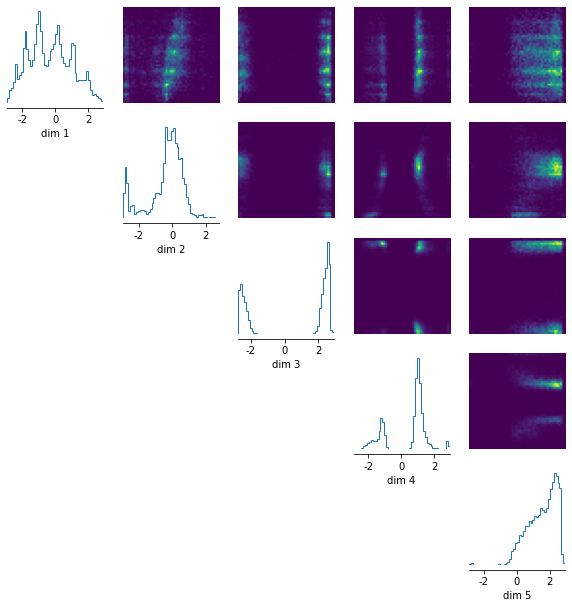

In [59]:
samples = posterior.sample((10000,))
_ = pairplot(samples)

In [9]:
from sbi.vi.paretto_smoothed_is import gpdfit

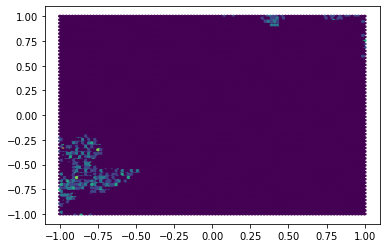

In [16]:
samples = posterior._prior.sample((10000,))
x_obs = task.get_observation(1).repeat(10000,1)
ratio = posterior.net.log_prob(x_obs, samples) + posterior._prior.log_prob(samples)-posterior.log_prob(samples)
args, index = ratio.sort()
interesting = samples[index[-500:]]
plt.hexbin(interesting[:,0], interesting[:,1])

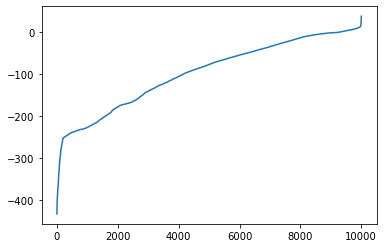

In [18]:
plt.plot(args.detach())

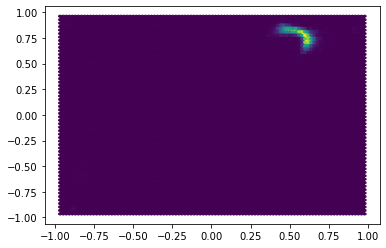

In [12]:
samples = posterior.sample((10000,))
plt.hexbin(samples[:,0], samples[:,1])

In [18]:
q = posterior.q
optimizer = torch.optim.Adam(q.parameters(),lr=1e-2)
for i in range(100):
    optimizer.zero_grad()
    if i > 50:
        samples = posterior.q.sample((1000,))
    else:
        samples = posterior._prior.sample((1000,))
    x_obs = task.get_observation(1).repeat(1000,1)
    ratio = posterior.net.log_prob(x_obs, samples) + posterior._prior.log_prob(samples)-posterior.log_prob(samples)
    args, index = ratio.sort()
    interesting = samples[index[-100:]]
    loss = -q.log_prob(interesting).mean()
    loss.backward()
    optimizer.step()

In [13]:
q = posterior.q
optimizer = torch.optim.Adam(q.parameters(),lr=1e-2)
for i in range(500):
    optimizer.zero_grad()
    if i > 50:
        samples = posterior.q.sample((1000,))
    else:
        samples = posterior._prior.sample((1000,))
    x_obs = task.get_observation(1).repeat(1000,1)
    ratio = posterior.net.log_prob(x_obs, samples) + posterior._prior.log_prob(samples)-posterior.log_prob(samples)
    logweights, index = ratio.sort()
    weights = logweights.softmax(0)
    loss = -(q.log_prob(samples[index])*weights).mean()
    loss.backward()
    optimizer.step()

In [59]:
gpdfit(args[-500:])

(tensor(-0.0561, grad_fn=<AddBackward0>),
 tensor(4.4949, grad_fn=<DivBackward0>))

In [526]:
posterior.train(n_particles=1024,optimizer=torch.optim.SGD,learning_rate=1e-4, momentum=0.5, clip_value=20.,reduce_variance=True)

Loss: 54.98: 100%|██████████| 2000/2000 [06:43<00:00,  4.95it/s]
Quality Score: 0.005 (smaller values are good, should be below 1, mode collapse may still occured.)


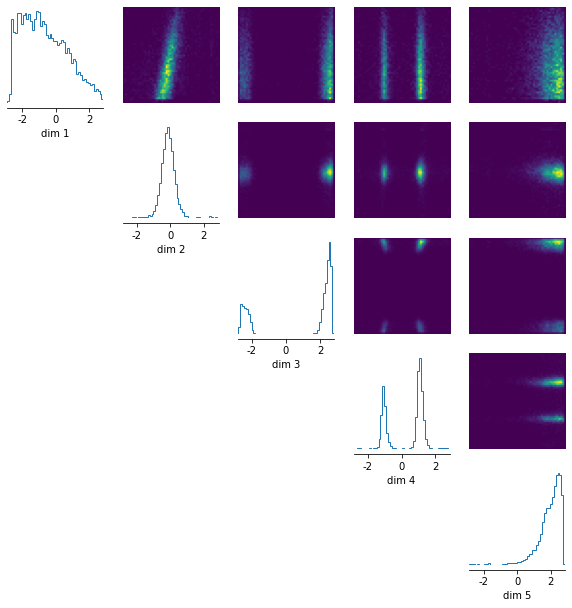

In [19]:
samples = posterior.q.sample((10000,))
# eps = posterior.q.standardize(samples)
# _ = pairplot(eps.detach())
_ = pairplot(samples.detach())


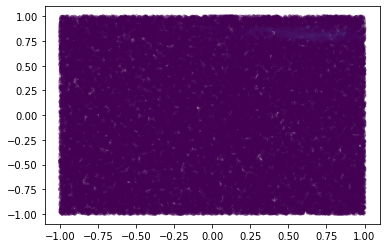

In [21]:
x = torch.rand(50000,2)*2 - 1
p = posterior.q.log_prob(x).detach().exp()
plt.scatter(x[:,0], x[:,1],c=p,s=10, alpha=0.3)

In [10]:
from tensorflow_probability import distributions as tfd
import tensorflow as tf
from tensorflow_probability.python.internal import prefer_static as ps

In [12]:

gm = tfd.MixtureSameFamily(
    mixture_distribution=tfd.Categorical(
        probs=[0.1, 0.7, 0.2]),
    components_distribution=tfd.Normal(
      loc=[[-1., 1,3],[-1., 1,3], [-1, 1,3.]],       
      scale=[[0.1, 0.1, 0.1],[0.1,0.1,0.1], [0.1,0.1,0.1]]))
x = gm.sample()
event_shape = gm.event_shape
gm._distributional_transform(x, gm.event_shape)

univariate_components = gm._components_distribution
event_ndims = ps.rank_from_shape(event_shape)
x_padded = gm._pad_sample_dims(x, event_ndims=event_ndims)  # [S, B, 1, E]
logits_mix_prob = gm.mixture_distribution.logits_parameter()
logits_mix_prob = tf.reshape(
    logits_mix_prob,  # [k] or [B, k]
    ps.concat([
        ps.shape(logits_mix_prob),
        ps.ones([event_ndims], dtype=tf.int32),
    ], axis=0))  # [k, [1]*e] 
log_prob_x = univariate_components.log_prob(x_padded)  # [S, B, k, E]
cdf_x = univariate_components.cdf(x_padded)  # [S, B, k, E]

(<Figure size 720x720 with 9 Axes>,
 array([[<AxesSubplot:xlabel='dim 1'>, <AxesSubplot:>, <AxesSubplot:>],
        [<AxesSubplot:>, <AxesSubplot:xlabel='dim 2'>, <AxesSubplot:>],
        [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:xlabel='dim 3'>]],
       dtype=object))

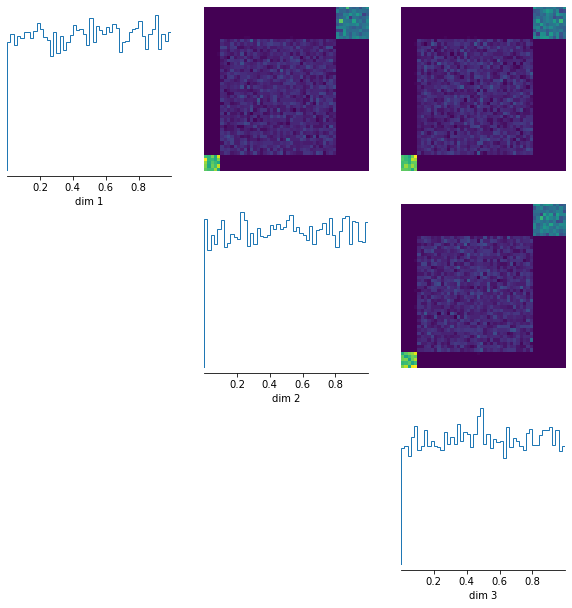

In [13]:
samples = gm.sample((10000,)) 
eps = gm._distributional_transform(samples,gm.event_shape)
pairplot(eps.numpy())

In [14]:
event_size = ps.cast(
ps.reduce_prod(event_shape), dtype=tf.int32)
cumsum_log_prob_x = tf.reshape(
tf.math.cumsum(
    # [S*prod(B)*k, prod(E)]
    tf.reshape(log_prob_x, [-1, event_size]),
    exclusive=True,
    axis=-1),
ps.shape(log_prob_x))  # [S, B, k, E]
cumsum_log_prob_x

<tf.Tensor: shape=(3, 3), dtype=float32, numpy=
array([[0., 0., 0.],
       [0., 0., 0.],
       [0., 0., 0.]], dtype=float32)>

In [125]:
event_ndims = ps.rank_from_shape([])
logits_mix_prob = gm.mixture_distribution.logits_parameter()
logits_mix_prob = tf.reshape(
    logits_mix_prob,  # [k] or [B, k]
    ps.concat([
        ps.shape(logits_mix_prob),
        ps.ones([event_ndims], dtype=tf.int32),
    ], axis=0))  # [k, [1]*e] or [B, k, [1]*e]

# Logits of the posterior weights: log w_k + log prob_k (x_1, ..., x_i-1)
log_posterior_weights_x = logits_mix_prob + cumsum_log_prob_x
posterior_weights_x = tf.math.softmax(
          log_posterior_weights_x, axis=0)
posterior_weights_x
tf.reduce_sum(posterior_weights_x * cdf_x, axis=0)

<tf.Tensor: shape=(3,), dtype=float32, numpy=array([1.        , 0.72257715, 0.        ], dtype=float32)>

In [126]:
gm._distributional_transform(x, [])

InvalidArgumentError: Incompatible shapes: [4,1] vs. [3,3] [Op:RealDiv]

In [17]:
log_prob_x

<tf.Tensor: shape=(3, 3), dtype=float32, numpy=
array([[-222.07501   ,    0.73336774, -176.45825   ],
       [-250.12303   ,   -1.5638446 , -153.00465   ],
       [-188.39888   ,    1.249707  , -209.1017    ]], dtype=float32)>

In [18]:
cdf_x

<tf.Tensor: shape=(3, 3), dtype=float32, numpy=
array([[1.       , 0.8729444, 0.       ],
       [1.       , 0.992408 , 0.       ],
       [1.       , 0.302379 , 0.       ]], dtype=float32)>

In [6]:
from sbi.vi.mixture_of_flows import MixtureDiagGaussians
from sbi.vi.mixture_of_flows import MixtureSameTransform
from sbi.vi.flows import AffineTransform
from torch.distributions.transforms import SigmoidTransform, ComposeTransform

loc = torch.tensor([[-1., 1,3],[-1., 1,-3], [-1, 1,3.], [-1, -1,3.]])
scale = torch.tensor([[0.1, 0.9, 0.1],[0.5,0.1,0.1], [0.1,0.5,0.1], [0.1,0.1,0.1]])
probs = torch.tensor([0.1, 0.7, 0.1,0.1])

base_dist = torch.distributions.Independent(
                torch.distributions.Normal(
                    torch.zeros(4,3),
                    torch.ones(4,3),
                ),
                1, ## TODO HERES IN ERROR IN CURRENT IMPLEMENTATAION!!!!
            )


t = AffineTransform(loc, scale)
link = SigmoidTransform()
qs = torch.distributions.TransformedDistribution(base_dist, [t, link])

# Create mixture distribution
mix = torch.distributions.Categorical(probs=probs)
gm2 = MixtureSameTransform(mix, qs)

In [5]:
x2  = gm2.sample()

In [6]:
x_pad = gm2._pad(x2)
transform1 = gm2._component_distribution.transforms[0]
transform2 = gm2._component_distribution.transforms[1]
transform = ComposeTransform(gm2._component_distribution.transforms)
eps = transform.inv(x_pad)
eps2 = transform2.inv(x_pad)
eps1 = transform1.inv(eps2)
base_dist = gm2._component_distribution.base_dist
base_dist.base_dist.log_prob(eps) -transform.log_abs_det_jacobian(eps, x_pad)  # - transform2.log_abs_det_jacobian(eps2, x_pad)  - transform1.log_abs_det_jacobian(eps1, eps2)

tensor([[[-1.9535e+01,  8.4071e-01, -1.8883e+03],
         [ 2.9459e-01,  2.8368e+00,  3.4499e+00],
         [-1.9535e+01,  1.4229e+00, -1.8883e+03],
         [-1.9535e+01, -2.0993e+02, -1.8883e+03]]])

In [7]:
qs.log_prob(x2)

tensor([-1907.0433,     6.5813, -1906.4612, -2117.8101])

In [8]:
log_prob_x = gm2.conditional_logprobs(x2)
log_prob_x

tensor([[[-1.9535e+01,  8.4071e-01, -1.8883e+03],
         [ 2.9459e-01,  2.8368e+00,  3.4499e+00],
         [-1.9535e+01,  1.4229e+00, -1.8883e+03],
         [-1.9535e+01, -2.0993e+02, -1.8883e+03]]])

In [9]:
cum_sum_logq_k = log_prob_x.cumsum(2).roll(1, 2)
cum_sum_logq_k[:, :, 0] = 0
cum_sum_logq_k

tensor([[[   0.0000,  -19.5349,  -18.6942],
         [   0.0000,    0.2946,    3.1314],
         [   0.0000,  -19.5349,  -18.1120],
         [   0.0000,  -19.5349, -229.4608]]])

In [10]:
logits_mix_prob = torch.log_softmax(gm2._mixture_distribution.logits, 0)
gm2._mixture_distribution.probs = logits_mix_prob.exp()
log_posterior_weights_x = logits_mix_prob.unsqueeze(1) + cum_sum_logq_k
posterior_weights = torch.softmax(log_posterior_weights_x, 1)
posterior_weights

tensor([[[1.0000e-01, 3.4919e-10, 4.7441e-11],
         [7.0000e-01, 1.0000e+00, 1.0000e+00],
         [1.0000e-01, 3.4919e-10, 8.4914e-11],
         [1.0000e-01, 3.4919e-10, 0.0000e+00]]])

In [11]:
gm2.component_distribution.sample((10000,)).mean(0)
gm2.component_distribution.sample((10000,)).std(0)

tensor([[0.0196, 0.1670, 0.0045],
        [0.0966, 0.0198, 0.0045],
        [0.0197, 0.0977, 0.0046],
        [0.0197, 0.0197, 0.0046]])

In [12]:
x2

tensor([0.4178, 0.7434, 0.0410])

In [13]:
gm2.conditional_cdf(x2)

tensor([[[1.0000, 0.5283, 0.0000],
         [0.9093, 0.7383, 0.0630],
         [1.0000, 0.5508, 0.0000],
         [1.0000, 1.0000, 0.0000]]])

In [14]:
gm2.standardize(x2)

tensor([[0.9365, 0.7383, 0.0630]])

(<Figure size 720x720 with 9 Axes>,
 array([[<AxesSubplot:xlabel='dim 1'>, <AxesSubplot:>, <AxesSubplot:>],
        [<AxesSubplot:>, <AxesSubplot:xlabel='dim 2'>, <AxesSubplot:>],
        [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:xlabel='dim 3'>]],
       dtype=object))

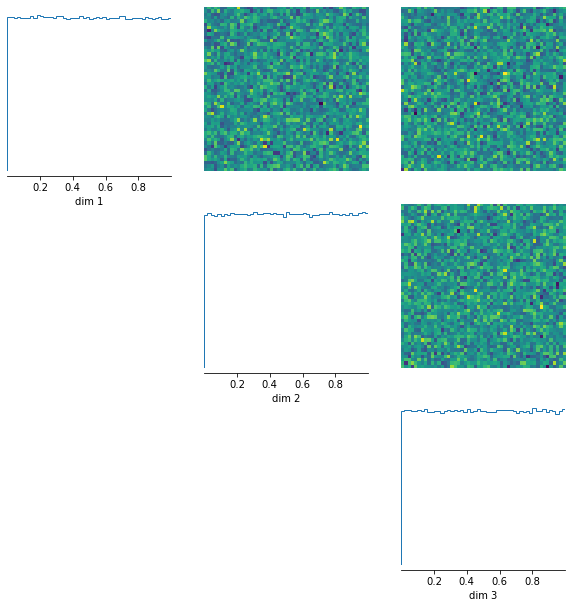

In [15]:
samples = gm2.sample((1000000,)) 
eps = gm2.standardize(samples)
pairplot(eps.numpy())

In [31]:
x_pad = x2
transform = gm2._component_distribution.transforms[0]
eps = transform.inv(x_pad)
base_dist = gm2._component_distribution.base_dist
log_prob = base_dist.base_dist.cdf(eps)
log_prob

tensor([[1.0000, 0.3799, 0.0000],
        [0.9880, 0.0030, 1.0000],
        [1.0000, 0.2910, 0.0000],
        [1.0000, 1.0000, 0.0000]])

In [2166]:
gm2.log_prob(x2)

tensor([2.5159])

In [1919]:
from torch.distributions.transforms import ComposeTransform
from sbi.

x_pad = gm2._pad(x2.T)
transform = gm2._component_distribution.transforms[0]
eps = transform.inv(x_pad)
base_dist = gm2._component_distribution.base_dist
log_prob = base_dist.base_dist.log_prob(eps)
log_prob

tensor([[[-110.4662, -213.3645, -208.1513],
         [  -1.4594,   -1.1068,   -0.9832],
         [ -13.6179, -188.8490, -193.8151]]])

In [1910]:
gm2.conditional_logprobs(x2)

tensor([[[-110.4662, -213.3645, -208.1513],
         [  -1.4594,   -1.1068,   -0.9832],
         [ -13.6179, -188.8490, -193.8151]]])